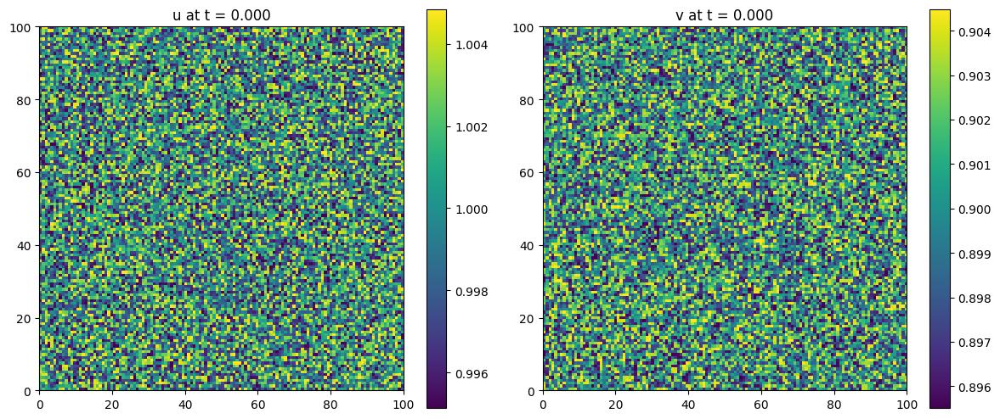

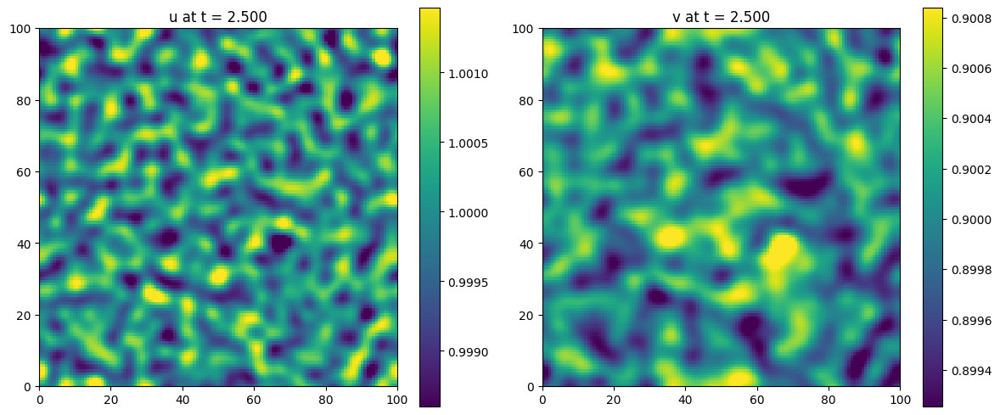

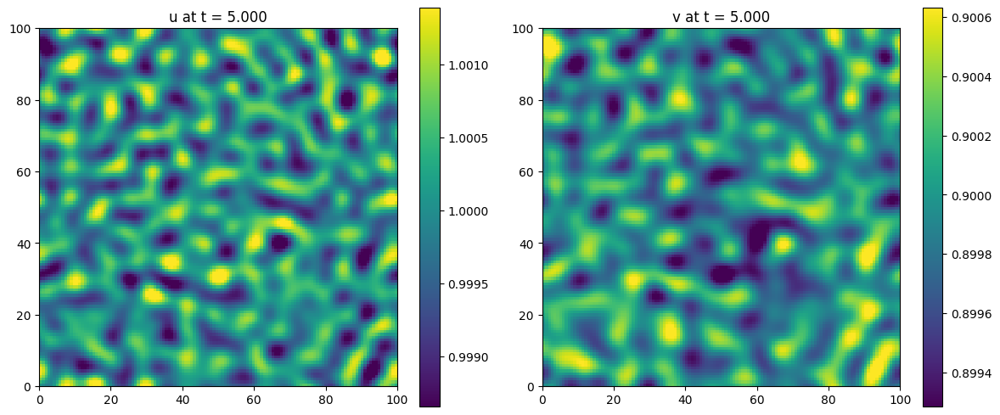

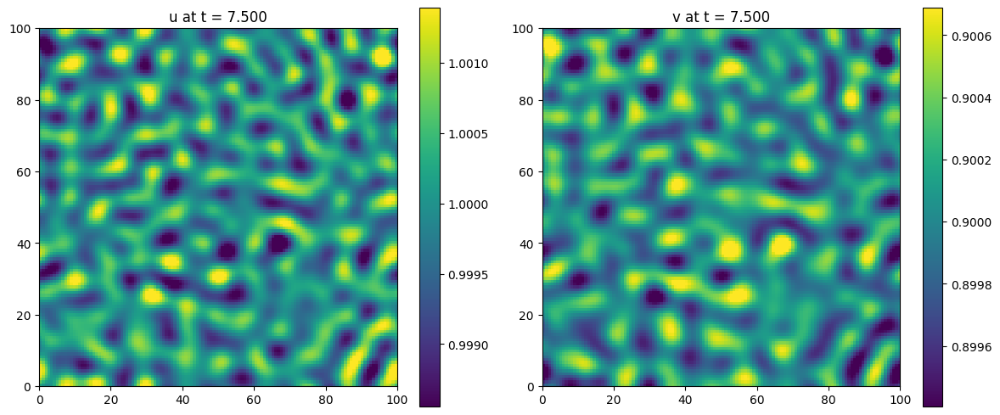

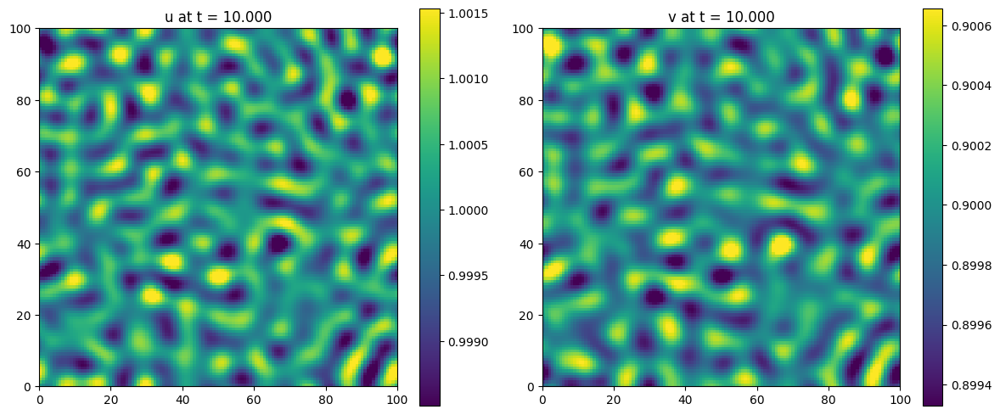

...

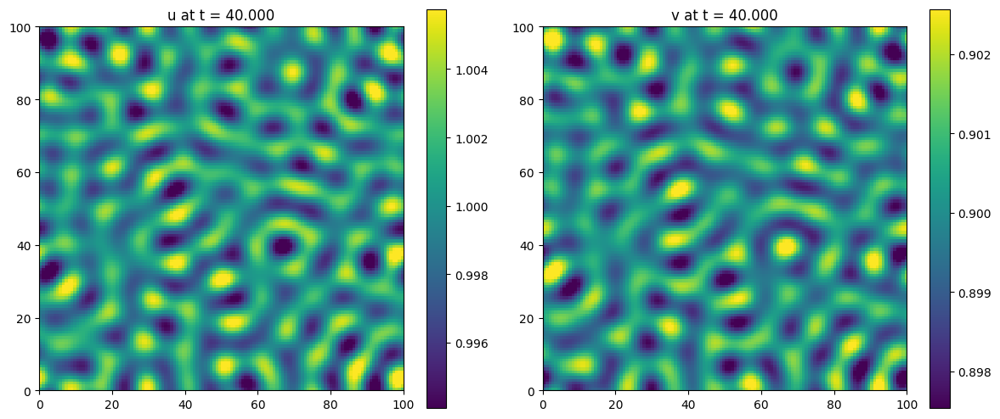

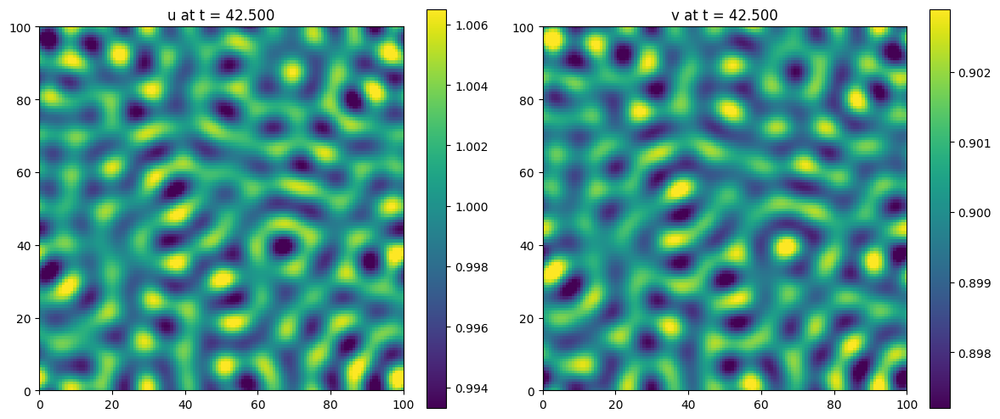

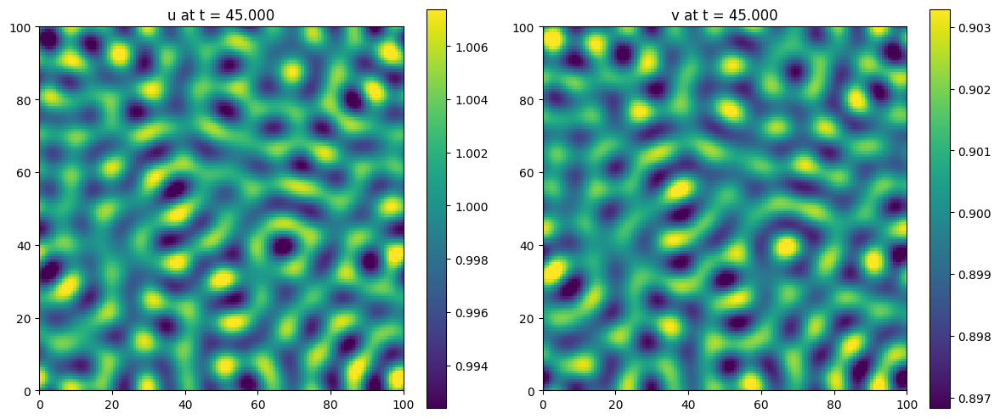

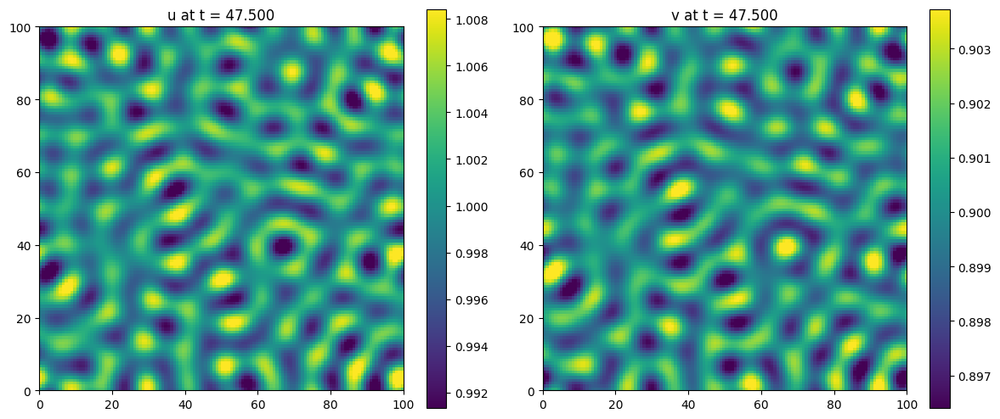

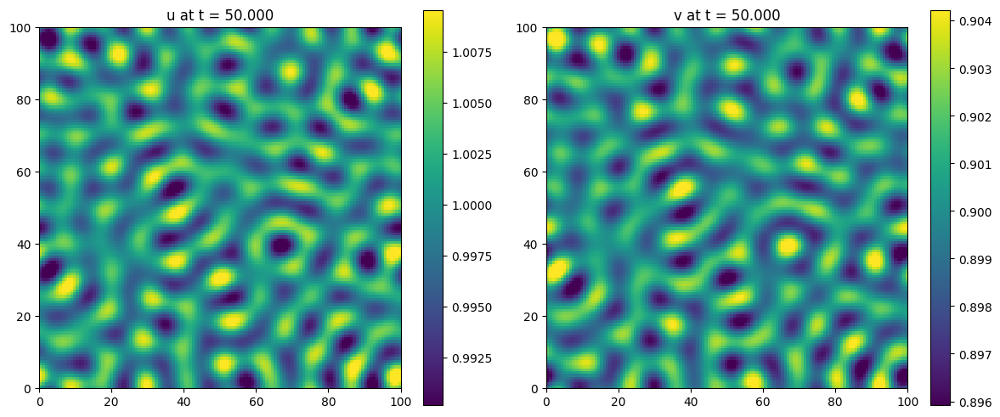

In [4]:
import numpy as np
import matplotlib.pyplot as plt
# It's good practice to import fft functions directly if used often
from numpy.fft import fft2, ifft2, fftfreq

def main():
    # -----------------------------
    # 1. Parameters and Domain Setup
    # -----------------------------
    # Grid resolution and physical domain size:
    Nx, Ny = 128, 128      # number of grid points in x and y
    Lx, Ly = 100.0, 100.0    # domain lengths in x and y
    dx, dy = Lx / Nx, Ly / Ny

    # Schnakenberg parameters
    a = 0.1
    b = 0.9

    # Diffusion coefficients:
    Du = 1.0
    Dv = 10.0

    # Time stepping parameters
    # Spectral methods can often tolerate larger dt than explicit finite difference
    # but stability still depends on the non-linear part. 0.001 might be okay.
    dt = 0.001
    Tfinal = 50.0 # Increased Tfinal for pattern development
    Nt = int(Tfinal / dt)

    # Homogeneous steady state for Schnakenberg:
    u_ss = a + b
    v_ss = b / (u_ss**2)

    # Create spatial grid (periodic domain)
    x = np.linspace(0, Lx, Nx, endpoint=False)
    y = np.linspace(0, Ly, Ny, endpoint=False)
    X, Y = np.meshgrid(x, y, indexing='ij')

    # Initial conditions: homogeneous steady state with a small random perturbation.
    np.random.seed(0)
    u = u_ss + 0.01 * (np.random.rand(Nx, Ny) - 0.5)
    v = v_ss + 0.01 * (np.random.rand(Nx, Ny) - 0.5)

    # -----------------------------
    # 2. Define Fourier Modes
    # -----------------------------
    kx = 2 * np.pi * fftfreq(Nx, d=dx)
    ky = 2 * np.pi * fftfreq(Ny, d=dy)
    KX, KY = np.meshgrid(kx, ky, indexing='ij')
    # Protect against division by zero for k=0 mode if needed later,
    # but the denominator (1 + dt*D*ksq) handles k=0 correctly here.
    ksq = KX**2 + KY**2

    # Precompute denominators for efficiency
    den_u = 1.0 / (1.0 + dt * Du * ksq)
    den_v = 1.0 / (1.0 + dt * Dv * ksq)

    # -----------------------------
    # 3. Time Integration Loop
    # -----------------------------
    # Plotting parameters
    num_plots = 20 # Target number of plot updates
    plot_interval = Nt // num_plots
    if plot_interval == 0: plot_interval = 1

    # Consider creating figure once if layout issues are solved
    # plt.figure(figsize=(12, 5), constrained_layout=True) # Example

    for n in range(Nt + 1): # Loop to include final step
        # --- Compute nonlinear terms in physical space ---
        u_sq = u**2 # Calculate once
        u2v = u_sq * v
        f_u = a + u2v - u      # f(u,v) for u-equation
        g_v = b - u2v          # g(u,v) for v-equation

        # --- Transform to spectral space using 2D FFT ---
        u_hat = fft2(u)
        v_hat = fft2(v)
        f_hat = fft2(f_u)
        g_hat = fft2(g_v)

        # --- Semi-implicit update in spectral space ---
        u_hat_new = (u_hat + dt * f_hat) * den_u # Use precomputed denominator
        v_hat_new = (v_hat + dt * g_hat) * den_v # Use precomputed denominator

        # --- Transform back to physical space using inverse 2D FFT ---
        # Take only real part (imaginary part should be negligible due to symmetry)
        u = np.real(ifft2(u_hat_new))
        v = np.real(ifft2(v_hat_new))

        # --- Plotting (every plot_interval steps or last step) ---
        if n % plot_interval == 0 or n == Nt:
            # --- Calculate 1st and 99th percentiles for color limits ---
            u_min, u_max = np.percentile(u, [1, 99])
            v_min, v_max = np.percentile(v, [1, 99])
            # Handle case where min/max are identical (flat field)
            if u_min == u_max: u_max = u_min + 1e-6
            if v_min == v_max: v_max = v_min + 1e-6
            # -----------------------------------------------------------

            # plt.clf() # Use if figure created outside loop with constrained_layout
            plt.figure(figsize=(12, 5)) # Create new figure each time (simpler)

            plt.subplot(1, 2, 1)
            plt.imshow(u, extent=[0, Lx, 0, Ly], origin='lower',
                       cmap='viridis', interpolation='none', # Example cmap, interpolation
                       vmin=u_min, vmax=u_max) # Apply percentile limits
            plt.title(f'u at t = {n * dt:.3f}')
            plt.colorbar()

            plt.subplot(1, 2, 2)
            plt.imshow(v, extent=[0, Lx, 0, Ly], origin='lower',
                       cmap='viridis', interpolation='none', # Example cmap, interpolation
                       vmin=v_min, vmax=v_max) # Apply percentile limits
            plt.title(f'v at t = {n * dt:.3f}')
            plt.colorbar()

            plt.tight_layout() # Use if creating figure inside loop
            plt.pause(0.01) # Slightly longer pause might help rendering

    plt.show() # Keep final plot open

if __name__ == '__main__':
    main()

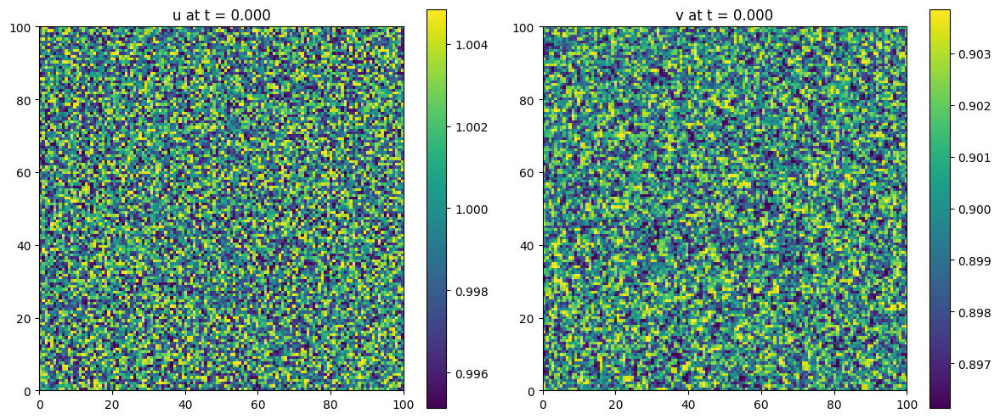

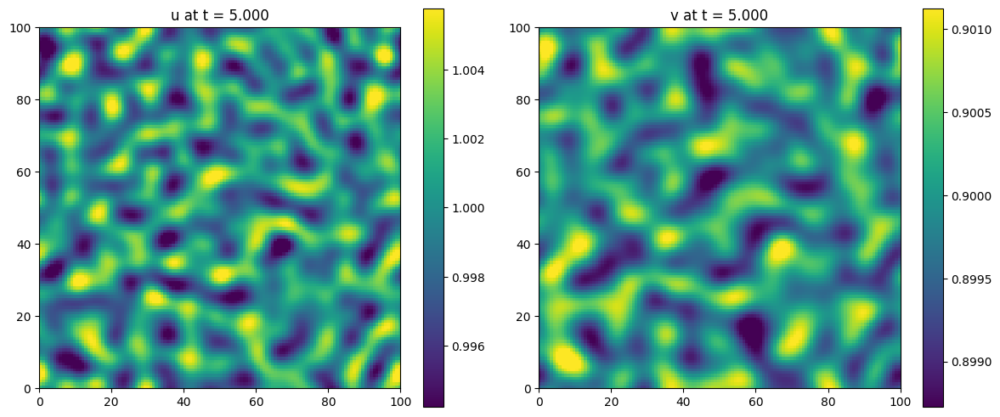

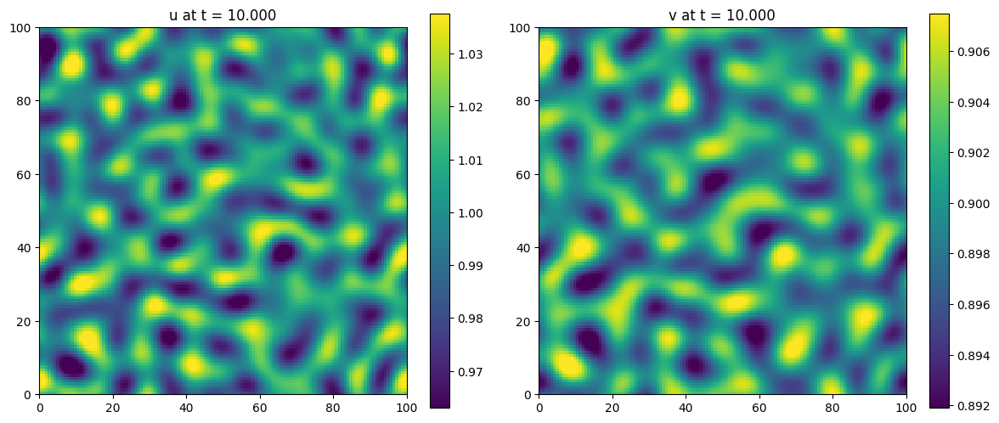

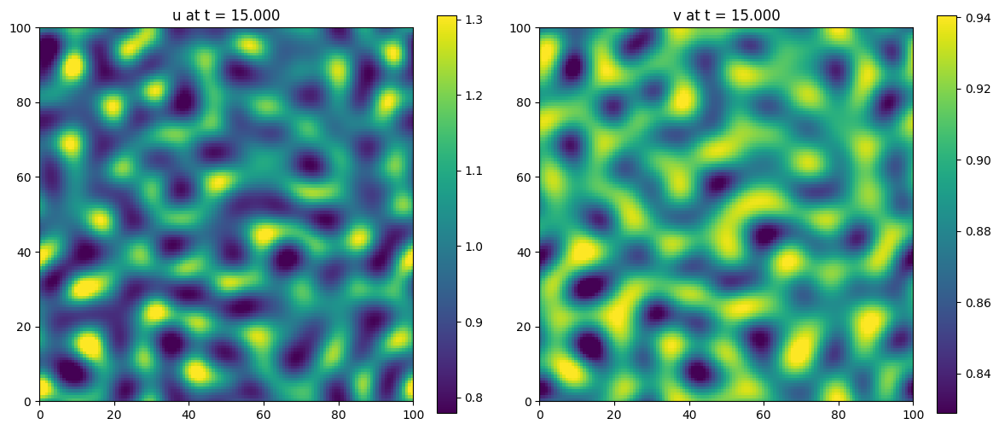

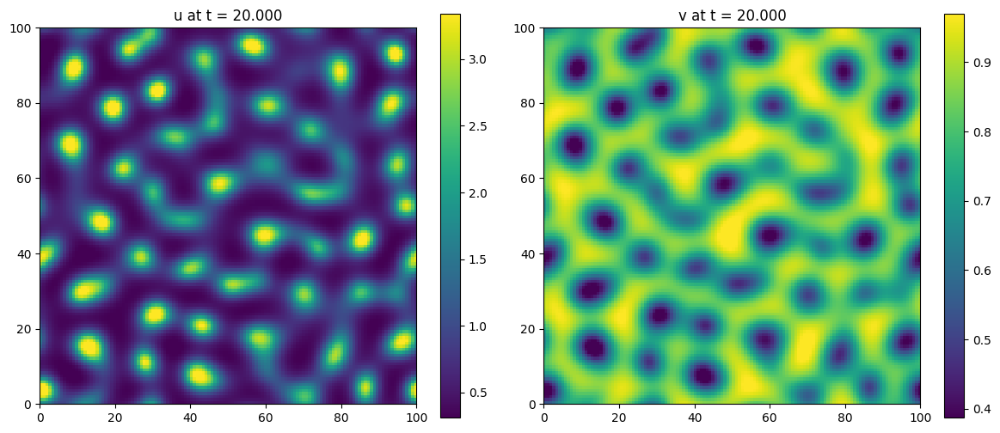

...

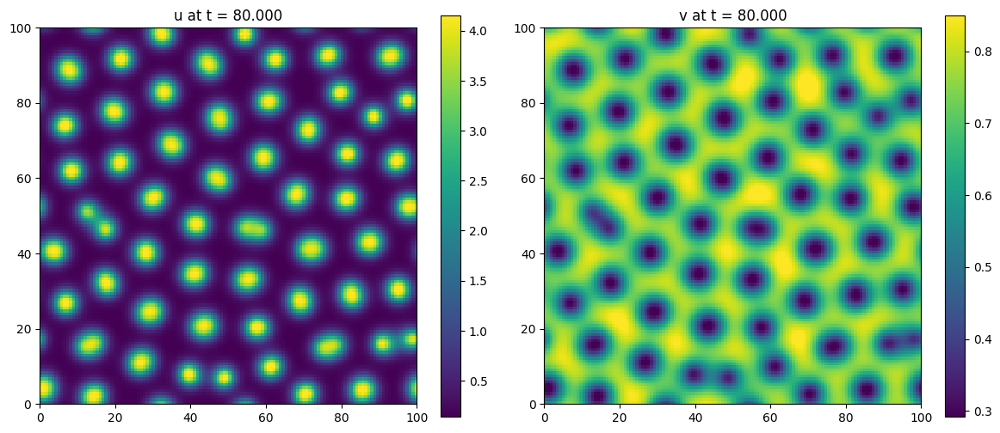

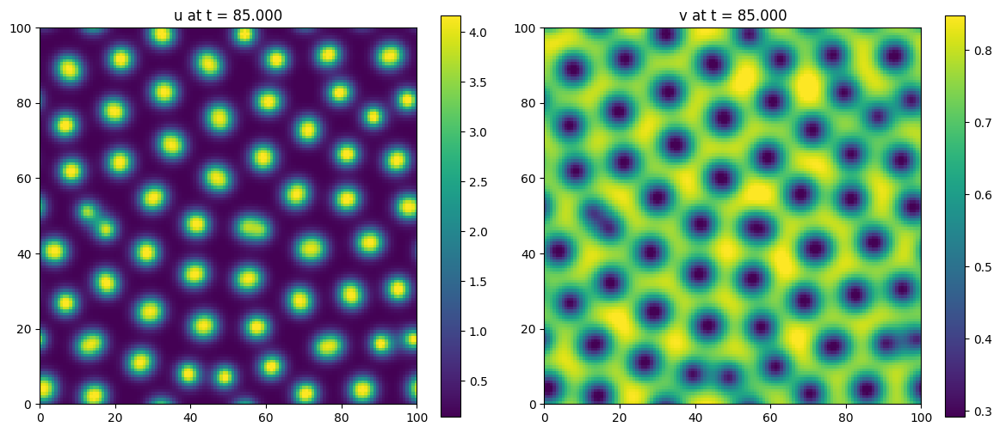

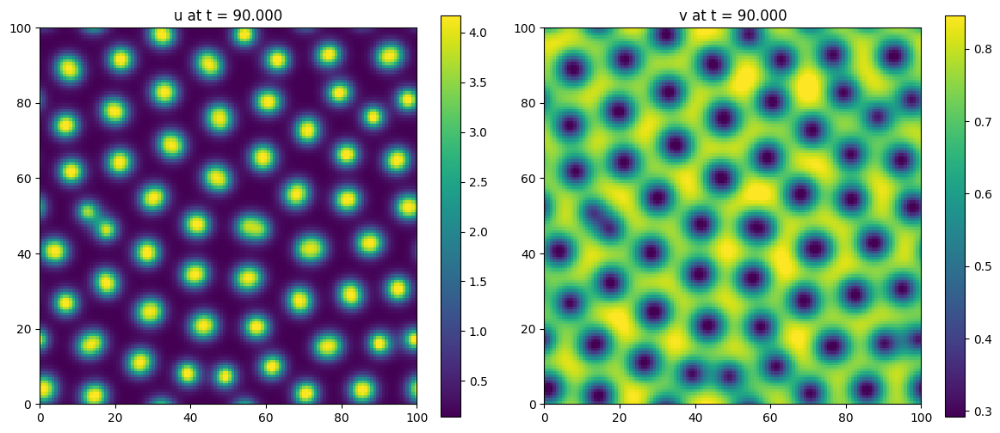

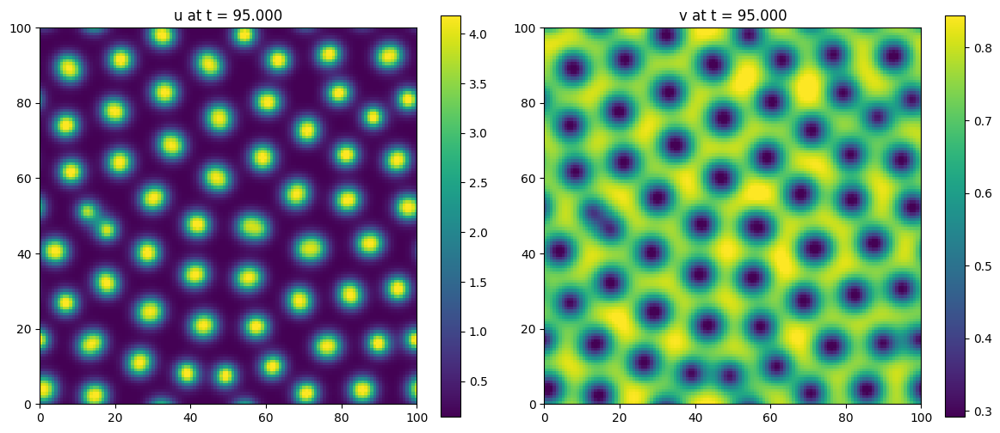

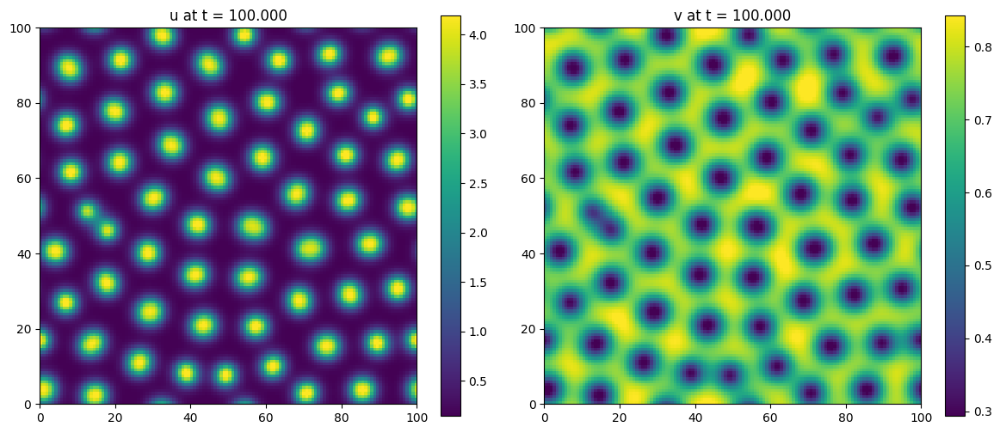

In [2]:
import numpy as np
import matplotlib.pyplot as plt
# It's good practice to import fft functions directly if used often
from numpy.fft import fft2, ifft2, fftfreq

def main():
    # -----------------------------
    # 1. Parameters and Domain Setup
    # -----------------------------
    # Grid resolution and physical domain size:
    Nx, Ny = 128, 128      # number of grid points in x and y
    Lx, Ly = 100.0, 100.0    # domain lengths in x and y
    dx, dy = Lx / Nx, Ly / Ny

    # Schnakenberg parameters
    a = 0.1
    b = 0.9

    # Diffusion coefficients:
    Du = 1.0
    # Dv = 10.0 # Note: Using Dv=10 again here, maybe use 40 for patterns?
    Dv = 40.0  # Sticking with value known for patterns

    # Time stepping parameters
    # Spectral methods can often tolerate larger dt than explicit finite difference
    # but stability still depends on the non-linear part. 0.001 might be okay.
    dt = 0.001
    Tfinal = 100.0 # Increased Tfinal for pattern development
    Nt = int(Tfinal / dt)

    # Homogeneous steady state for Schnakenberg:
    u_ss = a + b
    v_ss = b / (u_ss**2)

    # Create spatial grid (periodic domain)
    x = np.linspace(0, Lx, Nx, endpoint=False)
    y = np.linspace(0, Ly, Ny, endpoint=False)
    X, Y = np.meshgrid(x, y, indexing='ij')

    # Initial conditions: homogeneous steady state with a small random perturbation.
    np.random.seed(0)
    u = u_ss + 0.01 * (np.random.rand(Nx, Ny) - 0.5)
    v = v_ss + 0.01 * (np.random.rand(Nx, Ny) - 0.5)

    # -----------------------------
    # 2. Define Fourier Modes
    # -----------------------------
    kx = 2 * np.pi * fftfreq(Nx, d=dx)
    ky = 2 * np.pi * fftfreq(Ny, d=dy)
    KX, KY = np.meshgrid(kx, ky, indexing='ij')
    # Protect against division by zero for k=0 mode if needed later,
    # but the denominator (1 + dt*D*ksq) handles k=0 correctly here.
    ksq = KX**2 + KY**2

    # Precompute denominators for efficiency
    den_u = 1.0 / (1.0 + dt * Du * ksq)
    den_v = 1.0 / (1.0 + dt * Dv * ksq)

    # -----------------------------
    # 3. Time Integration Loop
    # -----------------------------
    # Plotting parameters
    num_plots = 20 # Target number of plot updates
    plot_interval = Nt // num_plots
    if plot_interval == 0: plot_interval = 1

    # Consider creating figure once if layout issues are solved
    # plt.figure(figsize=(12, 5), constrained_layout=True) # Example

    for n in range(Nt + 1): # Loop to include final step
        # --- Compute nonlinear terms in physical space ---
        u_sq = u**2 # Calculate once
        u2v = u_sq * v
        f_u = a + u2v - u      # f(u,v) for u-equation
        g_v = b - u2v          # g(u,v) for v-equation

        # --- Transform to spectral space using 2D FFT ---
        u_hat = fft2(u)
        v_hat = fft2(v)
        f_hat = fft2(f_u)
        g_hat = fft2(g_v)

        # --- Semi-implicit update in spectral space ---
        u_hat_new = (u_hat + dt * f_hat) * den_u # Use precomputed denominator
        v_hat_new = (v_hat + dt * g_hat) * den_v # Use precomputed denominator

        # --- Transform back to physical space using inverse 2D FFT ---
        # Take only real part (imaginary part should be negligible due to symmetry)
        u = np.real(ifft2(u_hat_new))
        v = np.real(ifft2(v_hat_new))

        # --- Plotting (every plot_interval steps or last step) ---
        if n % plot_interval == 0 or n == Nt:
            # --- Calculate 1st and 99th percentiles for color limits ---
            u_min, u_max = np.percentile(u, [1, 99])
            v_min, v_max = np.percentile(v, [1, 99])
            # Handle case where min/max are identical (flat field)
            if u_min == u_max: u_max = u_min + 1e-6
            if v_min == v_max: v_max = v_min + 1e-6
            # -----------------------------------------------------------

            # plt.clf() # Use if figure created outside loop with constrained_layout
            plt.figure(figsize=(12, 5)) # Create new figure each time (simpler)

            plt.subplot(1, 2, 1)
            plt.imshow(u, extent=[0, Lx, 0, Ly], origin='lower',
                       cmap='viridis', interpolation='none', # Example cmap, interpolation
                       vmin=u_min, vmax=u_max) # Apply percentile limits
            plt.title(f'u at t = {n * dt:.3f}')
            plt.colorbar()

            plt.subplot(1, 2, 2)
            plt.imshow(v, extent=[0, Lx, 0, Ly], origin='lower',
                       cmap='viridis', interpolation='none', # Example cmap, interpolation
                       vmin=v_min, vmax=v_max) # Apply percentile limits
            plt.title(f'v at t = {n * dt:.3f}')
            plt.colorbar()

            plt.tight_layout() # Use if creating figure inside loop
            plt.pause(0.01) # Slightly longer pause might help rendering

    plt.show() # Keep final plot open

if __name__ == '__main__':
    main()

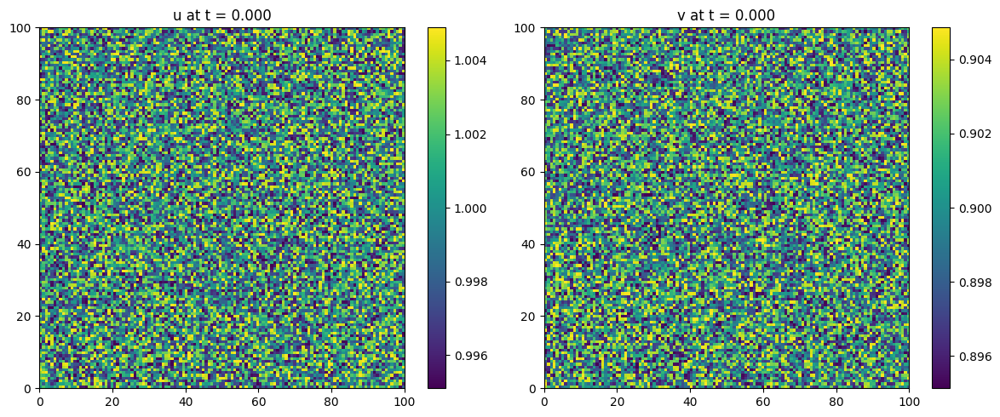

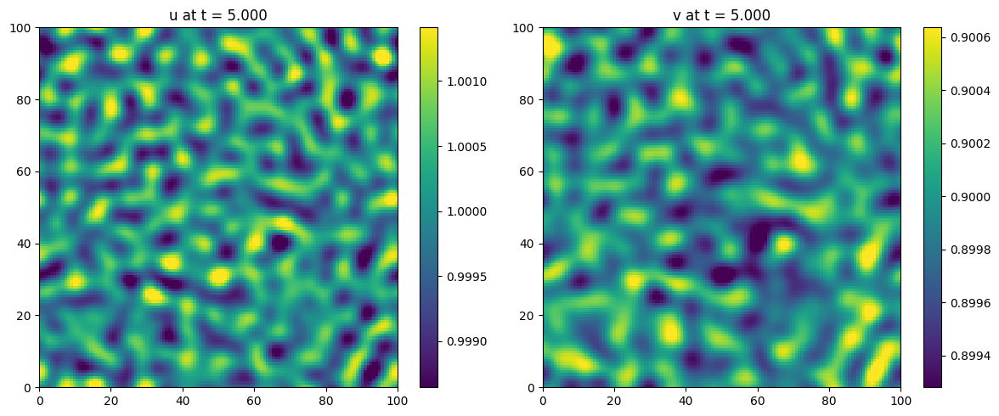

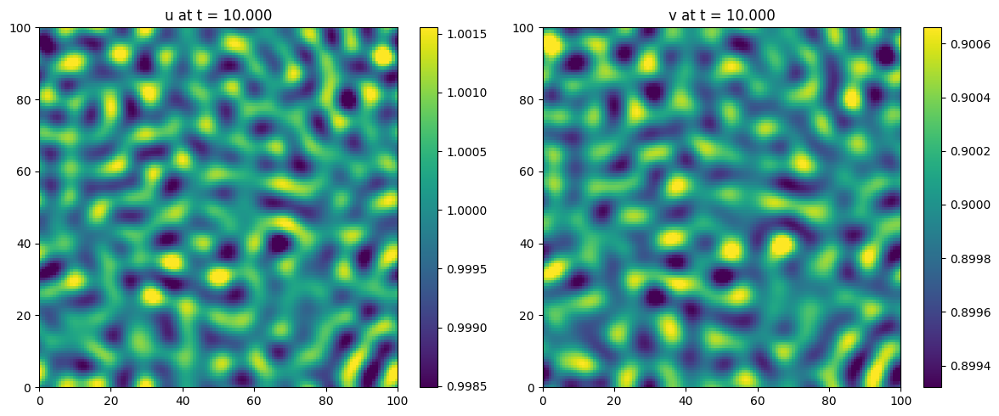

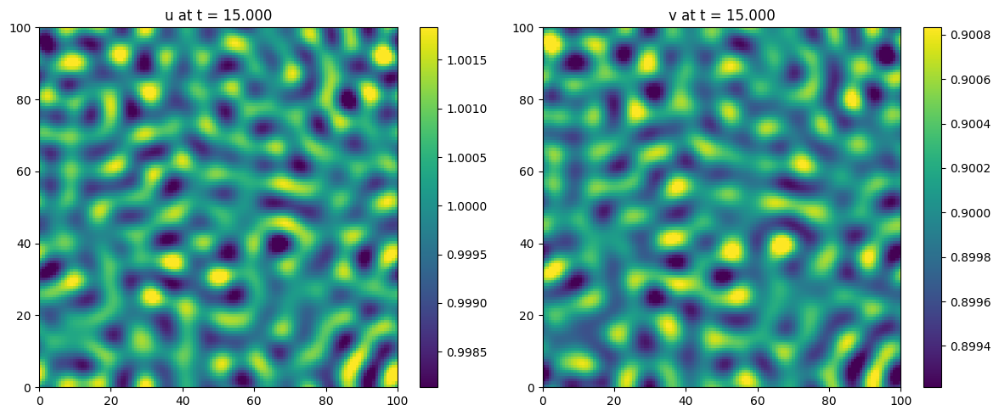

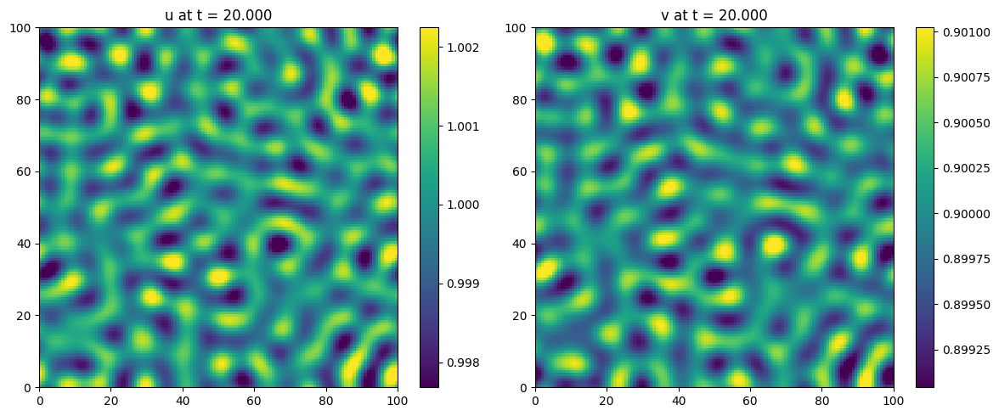

...

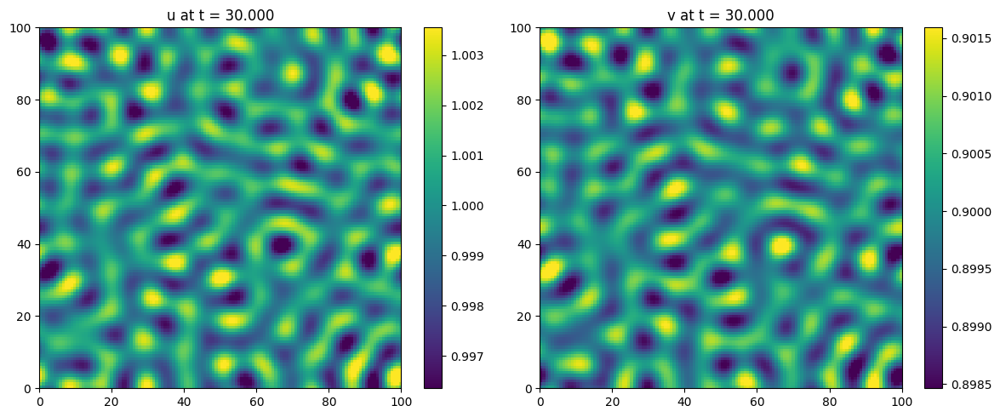

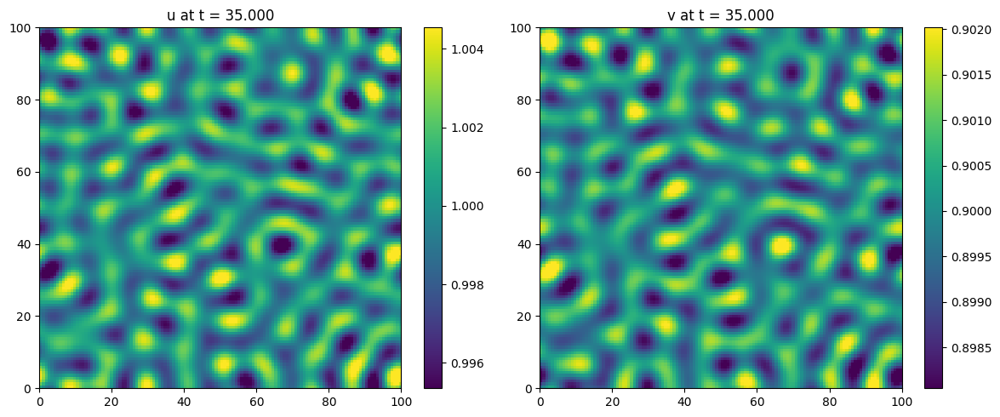

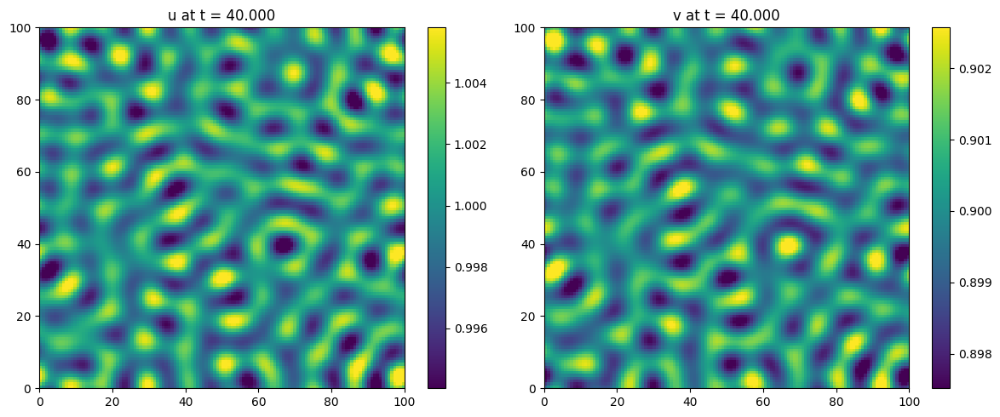

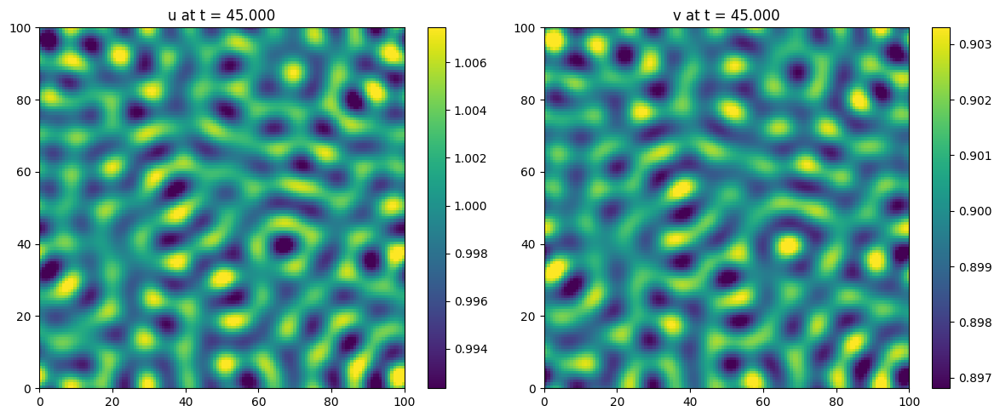

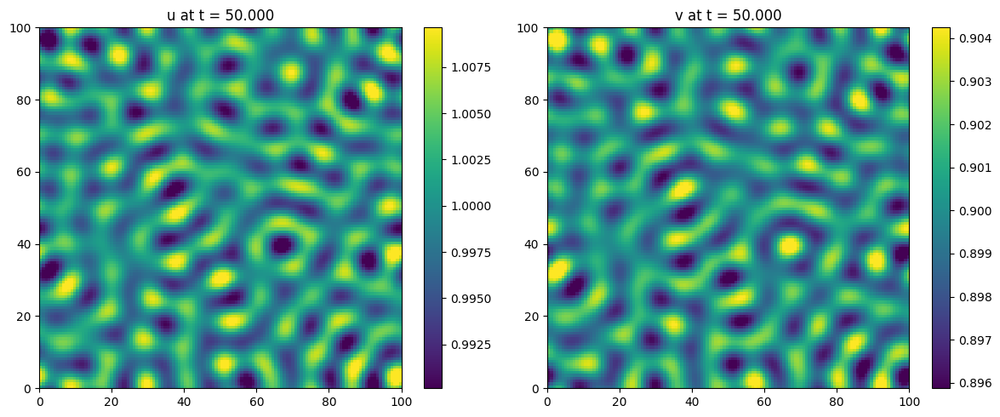

In [1]:
import numpy as np
import matplotlib.pyplot as plt

def finite_difference_schnakenberg():
    # ... [Parameter setup remains the same] ...
    Nx, Ny = 128, 128
    Lx, Ly = 100.0, 100.0
    dx, dy = Lx / Nx, Ly / Ny
    a = 0.1
    b = 0.9
    Du = 1.0
    Dv = 10.0
    dt = 1e-4*(128/Nx)**2
    Tfinal = 50.0
    Nt = int(Tfinal / dt)
    u_ss = a + b
    v_ss = b / (u_ss**2)
    np.random.seed(0)
    u = u_ss + 0.01 * (np.random.rand(Nx, Ny) - 0.5)
    v = v_ss + 0.01 * (np.random.rand(Nx, Ny) - 0.5)
    plot_interval = Nt // 10 # Plot maybe 10 times total
    if plot_interval == 0: plot_interval = 1 # Ensure plotting at least once

    # --- No plt.figure() here anymore ---

    for n in range(Nt + 1): # Loop up to Nt inclusive to see final state
        # ... [Laplacian calculation remains the same] ...
        lap_u = ((np.roll(u, -1, axis=0) + np.roll(u, 1, axis=0) - 2*u) / dx**2 +
                 (np.roll(u, -1, axis=1) + np.roll(u, 1, axis=1) - 2*u) / dy**2)
        lap_v = ((np.roll(v, -1, axis=0) + np.roll(v, 1, axis=0) - 2*v) / dx**2 +
                 (np.roll(v, -1, axis=1) + np.roll(v, 1, axis=1) - 2*v) / dy**2)
        # ... [Reaction terms calculation remains the same] ...
        f_u = a + u**2 * v - u
        g_v = b - u**2 * v
        # ... [Euler update remains the same] ...
        u_new = u + dt * (Du * lap_u + f_u)
        v_new = v + dt * (Dv * lap_v + g_v)
        u, v = u_new, v_new

        # -------------------------------------------------
        # Visualization: update plots periodically
        # -------------------------------------------------
        # Check if it's time to plot OR if it's the very last iteration
        if n % plot_interval == 0 or n == Nt:
            plt.figure(figsize=(12, 5))

            plt.subplot(1, 2, 1)
            u_min, u_max = np.percentile(u, [1, 99])
            plt.imshow(u, extent=[0, Lx, 0, Ly], origin='lower', aspect='auto', cmap='viridis', vmin=u_min, vmax=u_max, interpolation='none') # Added cmap
            plt.title(f'u at t = {n * dt:.3f}')
            plt.colorbar()

            plt.subplot(1, 2, 2)
            u_min, u_max = np.percentile(v, [1, 99])
            plt.imshow(v, extent=[0, Lx, 0, Ly], origin='lower', aspect='auto', cmap='viridis', vmin=u_min, vmax=u_max, interpolation='none') # Added cmap
            plt.title(f'v at t = {n * dt:.3f}')
            plt.colorbar()

            plt.tight_layout() # Adjust layout on the new figure
            plt.pause(0.001)   # Pause to display

    plt.show() # Keep the very last plot window open

if __name__ == '__main__':
    finite_difference_schnakenberg()

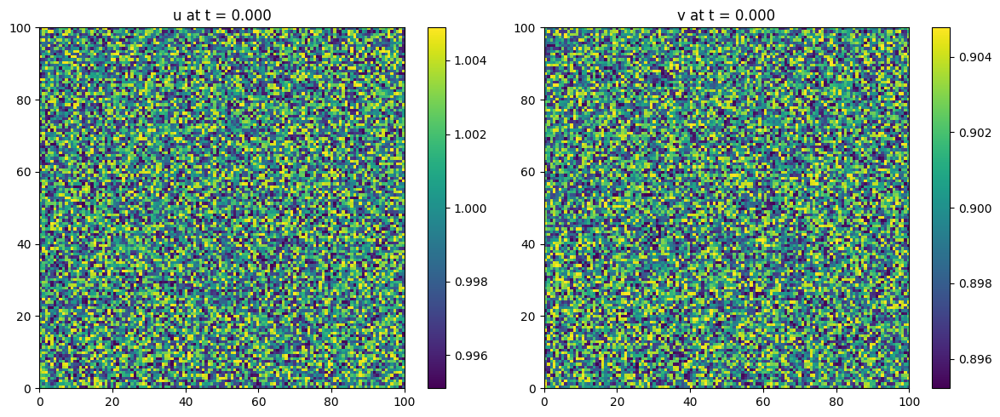

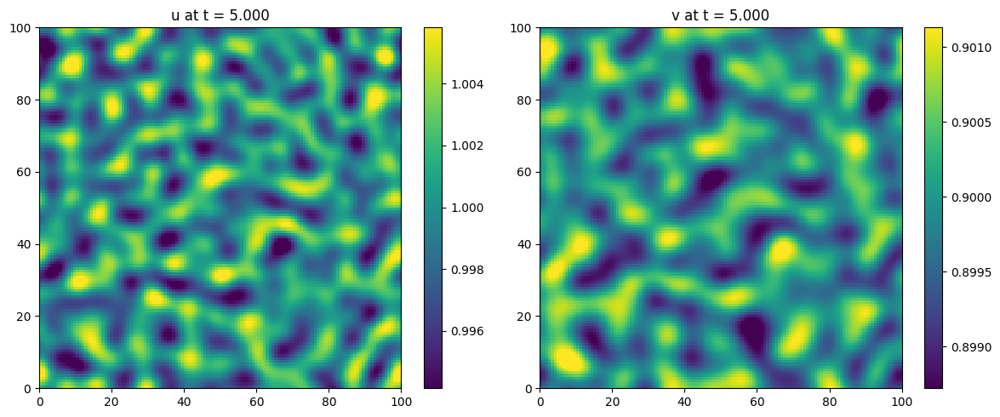

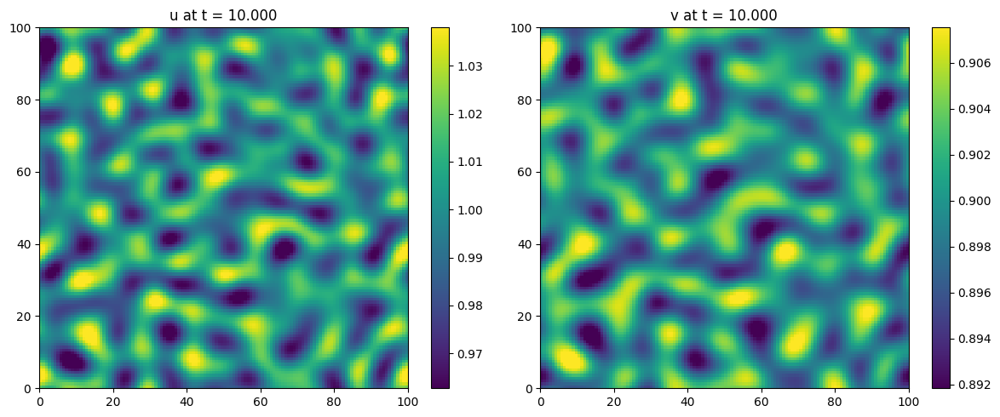

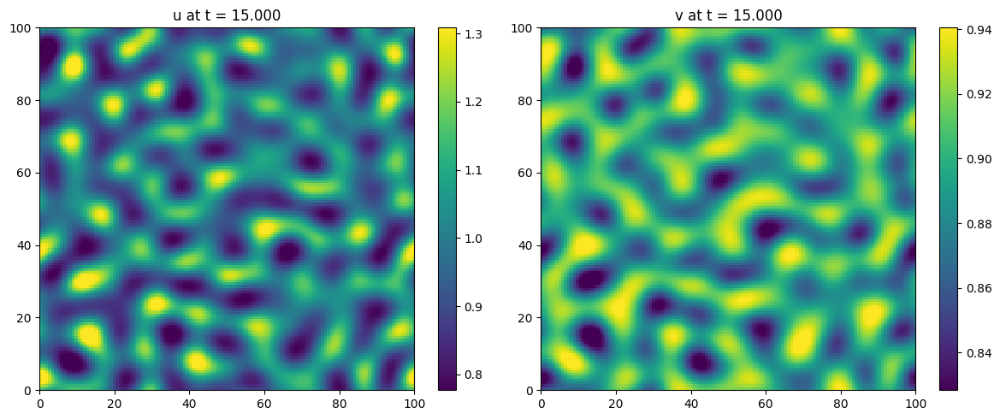

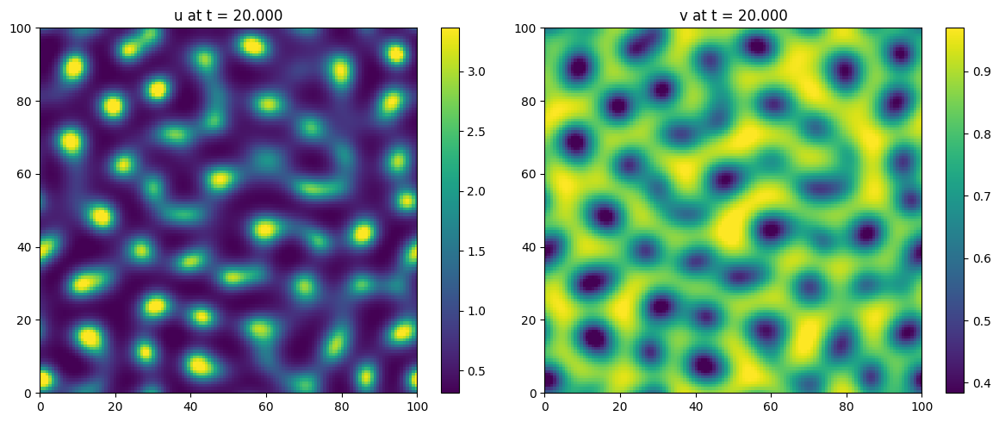

...

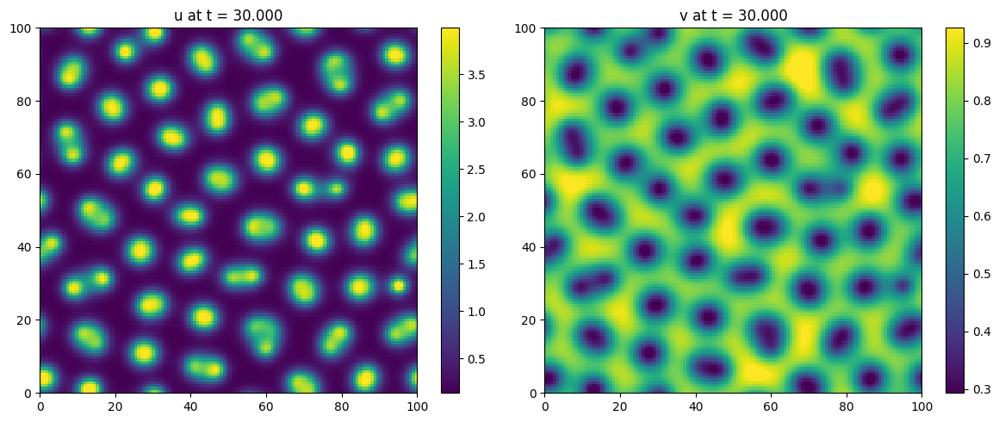

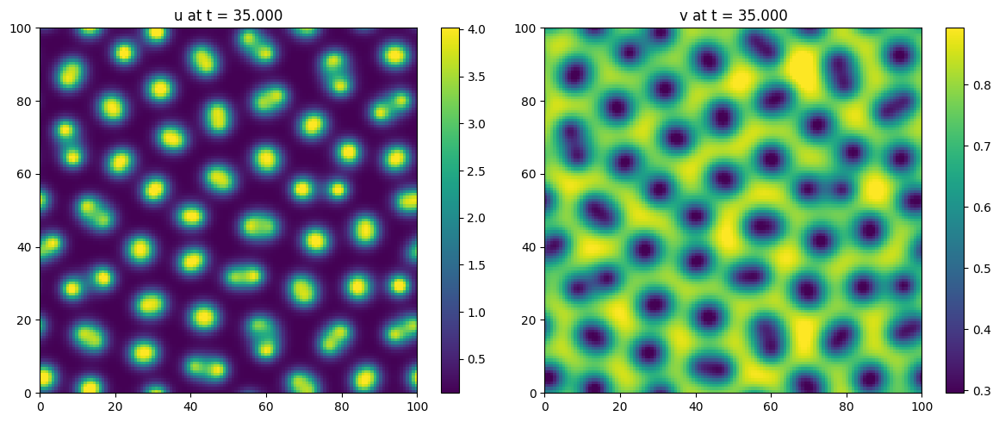

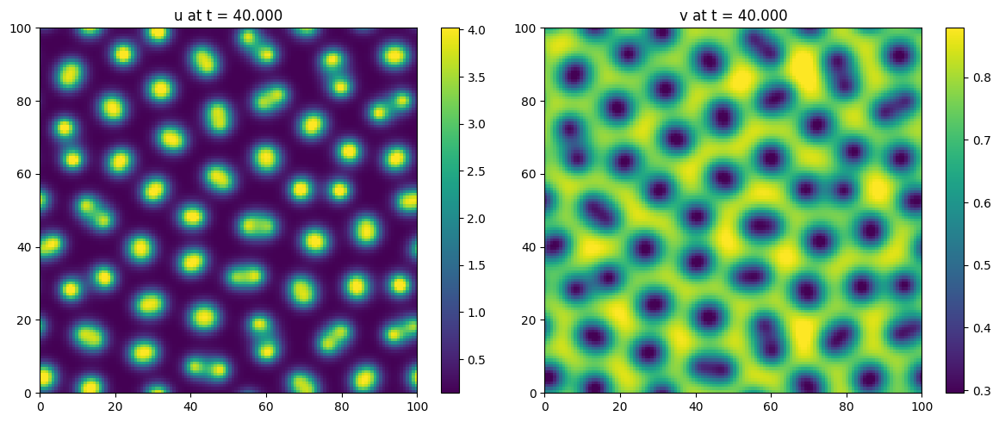

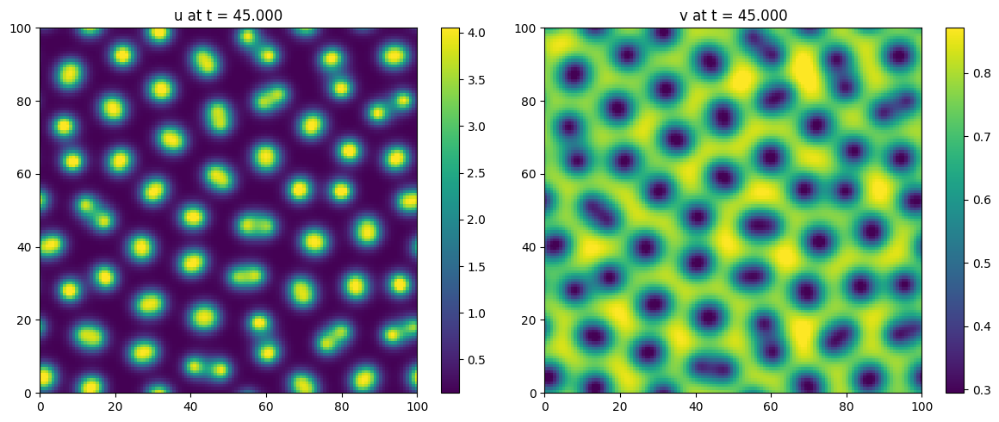

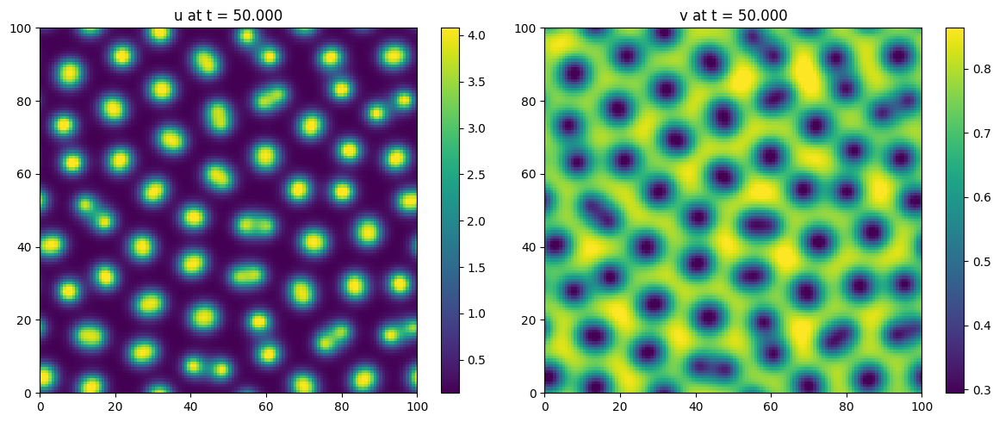

In [5]:
import numpy as np
import matplotlib.pyplot as plt

def finite_difference_schnakenberg():
    # ... [Parameter setup remains the same] ...
    Nx, Ny = 128, 128
    Lx, Ly = 100.0, 100.0
    dx, dy = Lx / Nx, Ly / Ny
    a = 0.1
    b = 0.9
    Du = 1.0
    Dv = 40.0
    dt = 1e-4*(128/Nx)**2
    Tfinal = 50.0
    Nt = int(Tfinal / dt)
    u_ss = a + b
    v_ss = b / (u_ss**2)
    np.random.seed(0)
    u = u_ss + 0.01 * (np.random.rand(Nx, Ny) - 0.5)
    v = v_ss + 0.01 * (np.random.rand(Nx, Ny) - 0.5)
    plot_interval = Nt // 10 # Plot maybe 10 times total
    if plot_interval == 0: plot_interval = 1 # Ensure plotting at least once

    # --- No plt.figure() here anymore ---

    for n in range(Nt + 1): # Loop up to Nt inclusive to see final state
        # ... [Laplacian calculation remains the same] ...
        lap_u = ((np.roll(u, -1, axis=0) + np.roll(u, 1, axis=0) - 2*u) / dx**2 +
                 (np.roll(u, -1, axis=1) + np.roll(u, 1, axis=1) - 2*u) / dy**2)
        lap_v = ((np.roll(v, -1, axis=0) + np.roll(v, 1, axis=0) - 2*v) / dx**2 +
                 (np.roll(v, -1, axis=1) + np.roll(v, 1, axis=1) - 2*v) / dy**2)
        # ... [Reaction terms calculation remains the same] ...
        f_u = a + u**2 * v - u
        g_v = b - u**2 * v
        # ... [Euler update remains the same] ...
        u_new = u + dt * (Du * lap_u + f_u)
        v_new = v + dt * (Dv * lap_v + g_v)
        u, v = u_new, v_new

        # -------------------------------------------------
        # Visualization: update plots periodically
        # -------------------------------------------------
        # Check if it's time to plot OR if it's the very last iteration
        if n % plot_interval == 0 or n == Nt:
            plt.figure(figsize=(12, 5))

            plt.subplot(1, 2, 1)
            u_min, u_max = np.percentile(u, [1, 99])
            plt.imshow(u, extent=[0, Lx, 0, Ly], origin='lower', aspect='auto', cmap='viridis', vmin=u_min, vmax=u_max, interpolation='none') # Added cmap
            plt.title(f'u at t = {n * dt:.3f}')
            plt.colorbar()

            plt.subplot(1, 2, 2)
            u_min, u_max = np.percentile(v, [1, 99])
            plt.imshow(v, extent=[0, Lx, 0, Ly], origin='lower', aspect='auto', cmap='viridis', vmin=u_min, vmax=u_max, interpolation='none') # Added cmap
            plt.title(f'v at t = {n * dt:.3f}')
            plt.colorbar()

            plt.tight_layout() # Adjust layout on the new figure
            plt.pause(0.001)   # Pause to display

    plt.show() # Keep the very last plot window open

if __name__ == '__main__':
    finite_difference_schnakenberg()